In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Unzip the uploaded data into Google Drive
#!unzip "/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/dog-breed-identification.zip" -d "/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow"

# End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using
TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

## 2. Data

Kaggle's dog breed identification competition: https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilites for each dog breed of
each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use
Deep Learning/Transfer Learning.
* There are 120 breeds of dogs(this means there are 120 different classes)
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

### Getting our workspace ready

* Import Tensorflow 2.x
* Import Tensorflow Hub
* Make sure we're using a GPU

In [ ]:
#!pip install tensorflow_hub --upgrade
#!pip install tensorflow --upgrade
#!pip install keras --upgrade

In [ ]:
# Import TensorFlow
import tensorflow as tf
import tensorflow_hub as hub

print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU" ,"available(YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available!")

TF version: 2.15.0
TF Hub version: 0.15.0
GPU available(YESS!!!!)


## Getting our data ready(turning into Tensors)
Our data has to be in numerical format, so that's what we'll be doing first!
Turning our images into Tensors(numbers).

Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: >

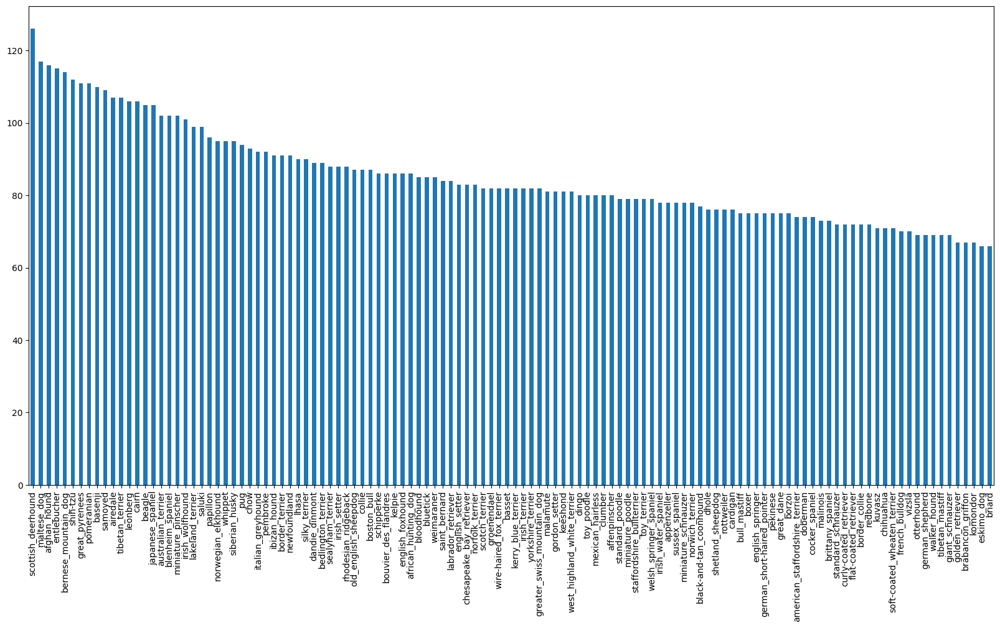

In [ ]:
# How many images are there in each breed?
labels_csv.breed.value_counts().plot.bar(figsize=(20,10))

In [ ]:
# What's the median number of images per class?
labels_csv['breed'].value_counts().median()

82.0

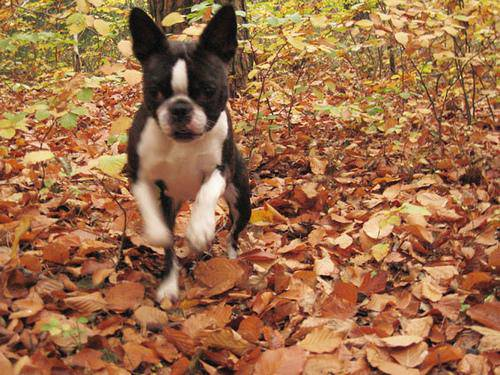

In [ ]:
# Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting images and their labels

Let's get a list of all our image file pathnames.

In [ ]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/train/" + fname + ".jpg" for fname in labels_csv['id']]

# Check the first 10
filenames[:10]

['drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/train")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! Proceed.


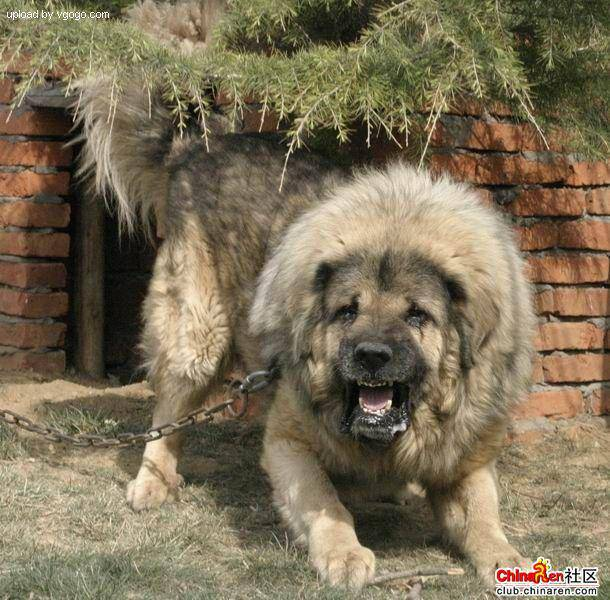

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv['breed'][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np

labels = labels_csv["breed"].to_numpy()
#labels = np.array(labels) # does the same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [ ]:
# Find unique label values
unique_breeds = np.unique(labels)
len(unique_breeds) #120 is the number of different dog breeds given in the competition

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels), len(labels)

(10222, 10222)

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where sample layer occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to
create our own validation set for tuning and optimizations...

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

We're going to start off experimenting
with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}
# hyperparameters are often set in Capitals


In [ ]:
# Let's split our data intp train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:2], y_train[:2]

(['drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, F

## Preprocess Images(turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert colour channel values from 0-255 to 0-1 values)
5. Resize the `image` to be a shape of (224,224)
6. Return the modified image

In [ ]:
# Convert an image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
# Turn image into a tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turns the image into a Tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # convert the colour channel values from 0-255 to 0-1 values (Normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired values (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10000+ images in one go... they'all might not fit into memory.

So that's why we do about 32(this is the batch size) images at a time(you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`.

In [ ]:
# Create a simple function to return a tuple(image,label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and associated label,
  process the image and returns a tuple of (image,label).
  """
  image = process_image(image_path)
  return image,label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data `(X & y)` into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X,y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input(no labels).
  """

  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (No labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                              tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # If it is a training dataset, we shuffle them..
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image,label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


`tf.data.Dataset.from_tensor_slices((tf.constant(X)))` converts the constant tensor into a TensorFlow dataset. It essentially slices the tensor along its first dimension, creating a dataset where each element corresponds to a row (or a slice) of the original tensor.

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches
Our data is now in batches, however, these can be a little hard to understand, let's visualize them!

In [ ]:
import matplotlib.pyplot as plt

# Creata a function for viewing imahes in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """

  # Setup the figure
  plt.figure(figsize=(10,10))

  # Loop through 25 (for displaying 25 images)
  for i in range(25):

    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5,5, i+1)

    # Display an image
    plt.imshow(images[i])

    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])

    # Turn the grid lines off
    plt.axis("off")


In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())

Steps Explained:

**train_data.as_numpy_iterator():**

1. Creates a NumPy iterator for the train_data dataset.
This iterator enables you to access the dataset's elements as NumPy arrays.
next(...):

2. Retrieves the next batch of data from the iterator.
The first call to next yields the first batch, subsequent calls yield subsequent batches.
Unpacking:

3. The batch is unpacked into the variables train_images and train_labels, where:
train_images holds the image data for the batch.
train_labels holds the corresponding labels for each image in the batch.

*Purpose:*

This code pattern is frequently used for:
Training machine learning models in batches, which is often more efficient than processing the entire dataset at once.
Inspecting and visualizing batches of data during model development.

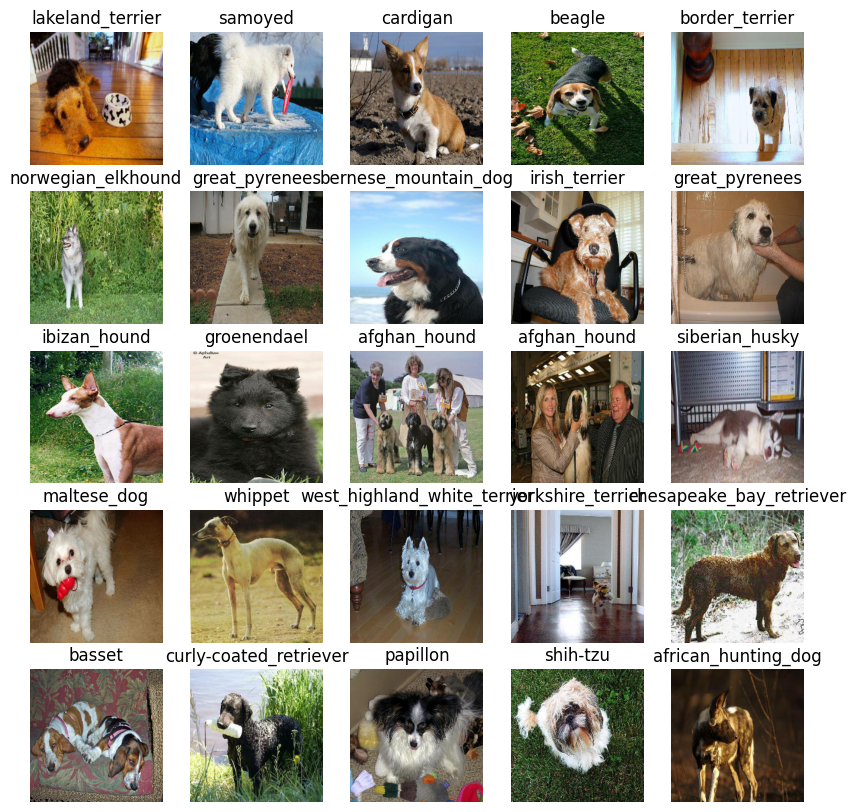

In [ ]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

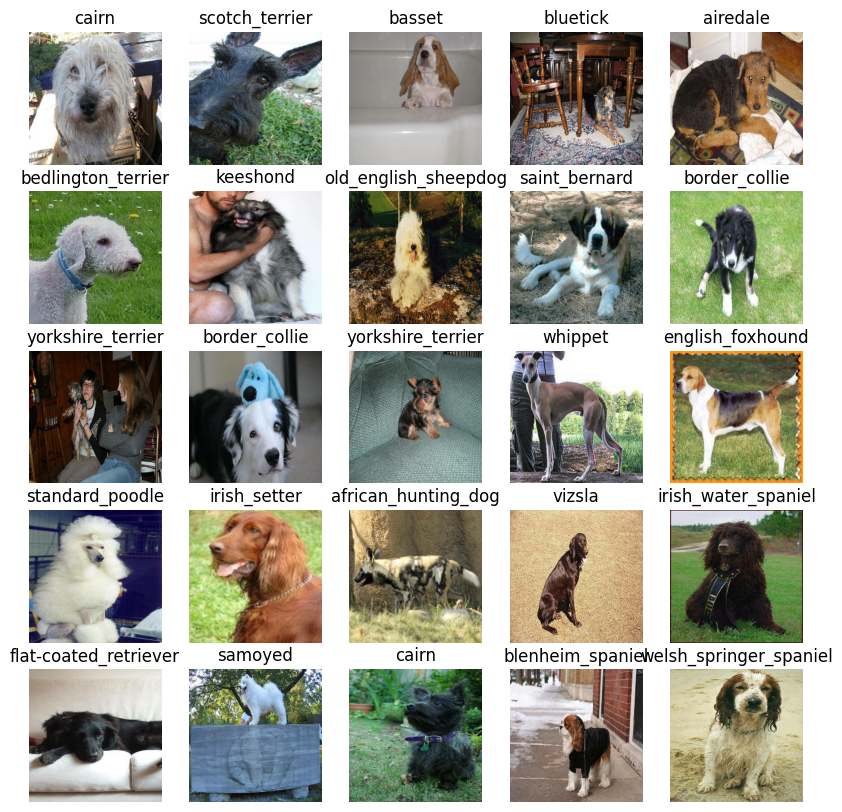

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building our model

Before we build a model, there are few things we need to define:
* The `input shape` (our images shape, in the form of Tensors) to our model.
* The `output shape` (image labels, in the form of tensors) of our model.
* The `URL` of the model we want to use from TensorFlow Hub

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1"

Now we've got out inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a funciton which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (Do this first, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model(tells the model the input shape it'll be getting).
* Returns the model.

All these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [ ]:
# Create a function which build keras model
def create_model(input_shape= INPUT_SHAPE, output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with: ", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation = 'softmax') # Layer 2 (output layer)
      ])

  # Compile the model
  model.compile(
    loss = tf.keras.losses.CategoricalCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(),
    metrics=['accuracy']
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
model = create_model()
model.summary()

Building model with:  https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating Callbacks

* Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

* We'll create 2 callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

## TensorBoard Callback

To setup a TensorBoard Callback, we need to do 3 things:
  1. Load the TensorBoard notebook extension
  2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
  3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).

  https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# create a function to build a TensorBoard  callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/logs",
                        # make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callbacks
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience =3)

## Training a model (on a subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU", "available(YESSS!!!!)" if tf.config.list_physical_devices("GPU") else "not available!")

GPU available(YESSS!!!!)


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for `(NUM_EPOCHS)` and the callbacks we'd like to use
* Return the model

In [ ]:
# build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  # create a model
  model = create_model()

  # Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with:  https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1
Epoch 1/100
25/25 [==============================] - 246s 10s/step - loss: 4.4397 - accuracy: 0.1088 - val_loss: 3.3008 - val_accuracy: 0.2950
Epoch 2/100
25/25 [==============================] - 4s 140ms/step - loss: 1.5926 - accuracy: 0.7063 - val_loss: 2.1103 - val_accuracy: 0.5300
Epoch 3/100
25/25 [==============================] - 3s 138ms/step - loss: 0.5560 - accuracy: 0.9375 - val_loss: 1.6213 - val_accuracy: 0.6000
Epoch 4/100
25/25 [==============================] - 4s 165ms/step - loss: 0.2541 - accuracy: 0.9925 - val_loss: 1.4592 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 3s 139ms/step - loss: 0.1479 - accuracy: 0.9950 - val_loss: 1.3873 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 5s 184ms/step - loss: 0.1003 - accuracy: 0.9987 - val_loss: 1.3513 - val_accuracy: 0.6550
Epoch 

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning!!!

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directly we created earlier and visualise its contents.

In [ ]:
%tensorboard --logdir "/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/logs"

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model


In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 115ms/step


array([[1.65726419e-03, 7.26260405e-05, 3.75059986e-04, ...,
        1.12396956e-04, 3.94014205e-05, 1.22966687e-03],
       [1.79890616e-04, 9.18525562e-04, 4.28647455e-03, ...,
        1.41113845e-03, 4.72434680e-04, 7.59873583e-05],
       [1.04537658e-05, 1.66351121e-04, 2.65484668e-05, ...,
        2.37282275e-05, 1.22186011e-05, 7.77609894e-05],
       ...,
       [1.42585100e-06, 1.91358436e-06, 3.95714824e-06, ...,
        5.86281021e-06, 1.23571108e-05, 1.90187984e-05],
       [3.42117390e-03, 5.03918054e-05, 8.56045735e-05, ...,
        9.15133278e-05, 8.95912526e-05, 5.61672589e-03],
       [1.47935920e-04, 1.45463400e-05, 1.27344090e-03, ...,
        2.71288957e-03, 1.42441085e-03, 1.44919231e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.91112384e-04 3.76049400e-04 3.66374879e-05 6.98218864e-05
 5.25846845e-03 1.31778841e-04 1.02668717e-04 1.66770129e-03
 1.38233704e-02 2.94377878e-02 5.65326218e-06 1.93455271e-05
 9.15765588e-04 2.62568519e-03 6.39872579e-03 1.67296920e-03
 8.15126696e-05 6.19552273e-04 5.67453571e-05 8.57302279e-04
 2.21700266e-05 3.43335996e-04 1.37755123e-04 3.30144721e-05
 1.28096258e-02 6.87920619e-05 1.03963881e-04 1.83382683e-04
 3.26711335e-04 6.44382453e-05 1.33967085e-04 1.31806126e-04
 8.60768778e-05 5.24712668e-05 3.30817929e-05 6.04425768e-05
 1.72395515e-03 4.15916205e-04 6.36075711e-05 2.79567122e-01
 2.65333132e-04 4.12523914e-05 8.13646056e-03 1.23057507e-05
 3.03102315e-05 1.27716397e-04 4.03374608e-04 7.90188380e-04
 1.64873956e-04 4.43525496e-04 2.14148735e-04 1.12355177e-04
 2.33630140e-04 1.33434299e-03 2.08585170e-05 4.49664425e-04
 8.77390194e-05 3.21800297e-04 4.45350561e-05 5.98806546e-05
 7.52098713e-05 8.64678586e-04 7.53513741e-05 2.22459748e-05
 1.99558490e-05 3.173901

In [ ]:
unique_breeds[113]

'walker_hound'

Having the above funcitonality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence intervals

In [ ]:
# Turn prediction probabilites into their respective label(easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilites
pred_label = get_pred_label(predictions[81])
pred_label

'irish_setter'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make
predictions on the validation images and then compare those predictions to the validation
labels(truth labels).


In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels(truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* Takes an array of prediction probabilites, an array of truth labels and an array of imagea and an integer
* Convert the prediction probabilities to a predicted label
* Plot the predicted label, it's predicted probability, the truth label and the target image in a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color='green'

  else:
    color = 'red'

  # Change plot title to be predicted, probability of prediction and truth labels
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)

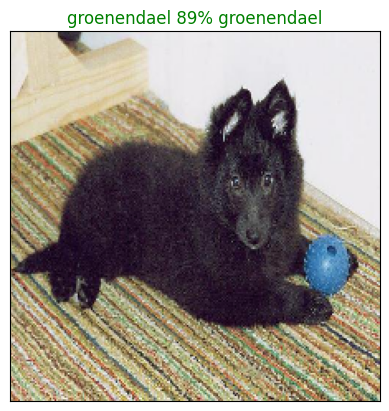

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our model's top prediction, let's make another
to view our models top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
    - Prediction probabilities indexes
    - Prediction probabilities values
    - Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """

  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]


  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

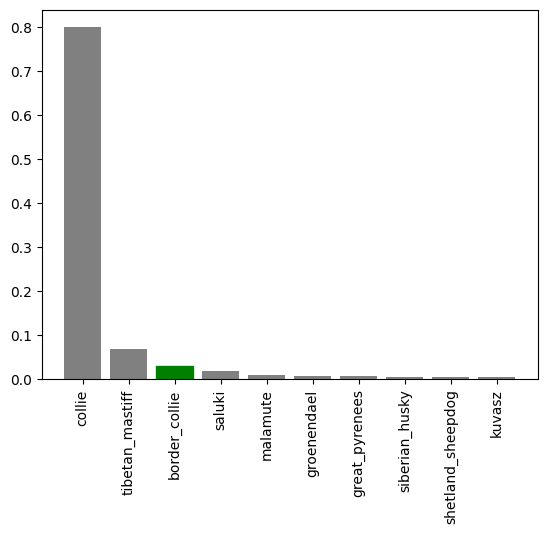

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels = val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few

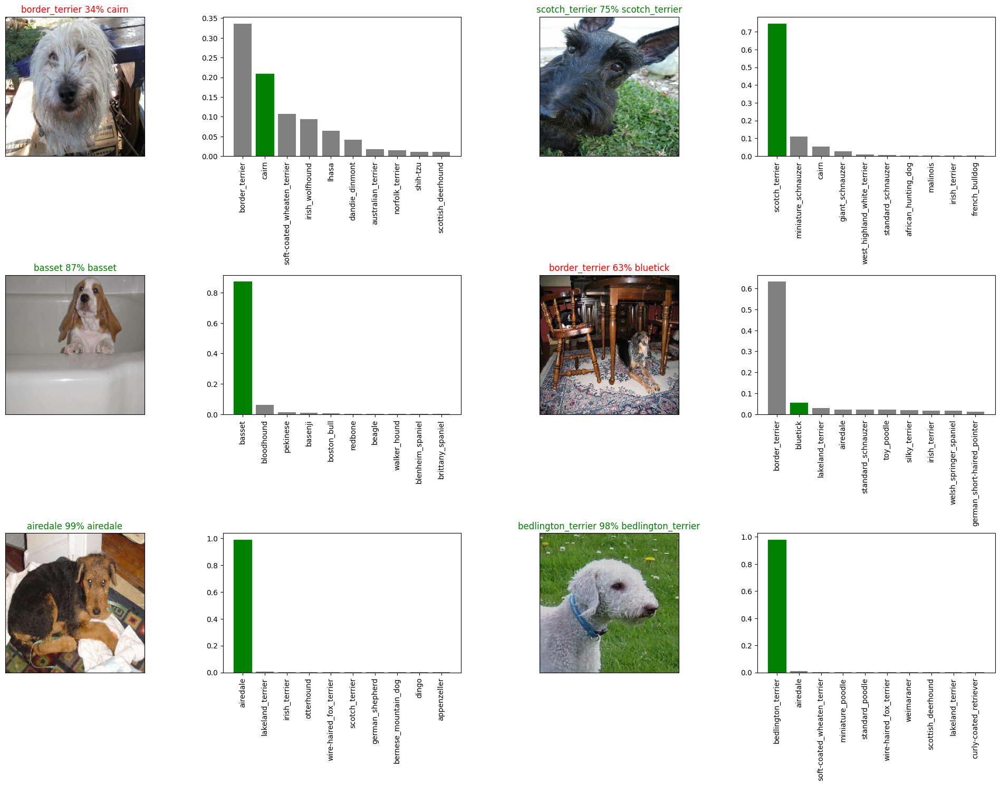

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix(string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"  #save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path


In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/models/20240118-17441705599870-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/models/20240118-17441705599870-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load our trained model
loaded_1000_image_model = load_model("/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/models/20240118-14311705588313-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/models/20240118-14311705588313-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 163ms/step - loss: 1.2062 - accuracy: 0.6950


[1.2062008380889893, 0.6949999928474426]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 154ms/step - loss: 1.2722 - accuracy: 0.6500


[1.272241234779358, 0.6499999761581421]

## Training a big dog model (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X,y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with:  https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)

**Note:** Running the cell below will take a little while (maybe upto 30mins for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 52s 150ms/step - loss: 1.3483 - accuracy: 0.6699
Epoch 2/100
320/320 [==============================] - 42s 132ms/step - loss: 0.3976 - accuracy: 0.8831
Epoch 3/100
320/320 [==============================] - 41s 129ms/step - loss: 0.2391 - accuracy: 0.9341
Epoch 4/100
320/320 [==============================] - 41s 127ms/step - loss: 0.1541 - accuracy: 0.9653
Epoch 5/100
320/320 [==============================] - 41s 128ms/step - loss: 0.1077 - accuracy: 0.9783
Epoch 6/100
320/320 [==============================] - 42s 131ms/step - loss: 0.0788 - accuracy: 0.9858
Epoch 7/100
320/320 [==============================] - 45s 140ms/step - loss: 0.0577 - accuracy: 0.9922
Epoch 8/100
320/320 [==============================] - 41s 128ms/step - loss: 0.0459 - accuracy: 0.9937
Epoch 9/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0375 - accuracy: 0.9962
Epoch 10/100
320/320 [==============================] - 42s 132m

In [ ]:
# Save our full model
save_model(full_model, suffix='full-image-set-mobilenetv2-Adam')

Saving model to: /content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/models/20240118-18001705600800-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/models/20240118-18001705600800-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model("/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/models/20240118-16411705596064-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/models/20240118-16411705596064-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the Test data

Since our model has been trained on images in the form of Tensor batches, to make
predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames
as input and convert them into Tensor batchs.

To make predictions on the test data, we'll:
* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batches()` and
setting the `test_data` parameter to `True`(since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called
on our model.


In [ ]:
# Load test image filenames
test_path = "/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/test/"
#test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames = [test_path + fname for fname in os.listdir(test_path) if os.path.isfile(os.path.join(test_path, fname))]

test_filenames[:10]

['/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/test/e1b9b0a95a4c7a3c4f3a3a8622314d37.jpg',
 '/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/test/e67cd079a0f9c15ebee3c41743906c73.jpg',
 '/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/test/dfc41d3f135d49a41e7b796883ff030e.jpg',
 '/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/test/e7f95aabf775a636b3893ffa120adaf9.jpg',
 '/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/test/e29d2336a8559d96973c874c9c6c17c6.jpg',
 '/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/test/de9a61a532241cff14e732f43b646d9a.jpg',
 '/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/test/e7e9dd51302fe08c1c89a550e183cf07.jpg',
 '/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorF

In [ ]:
len(test_filenames)

10357

In [ ]:
import os
import shutil

# Specify the directory to remove
directory_to_remove = "/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/test/.ipynb_checkpoints"

try:
    # Attempt to remove the directory
    if os.path.exists(directory_to_remove):
        if os.path.isdir(directory_to_remove):
            # Use shutil.rmtree() to remove non-empty directories
            shutil.rmtree(directory_to_remove)
            print(f"Directory '{directory_to_remove}' removed successfully.")
        else:
            # Use os.rmdir() to remove empty directories
            os.rmdir(directory_to_remove)
            print(f"Directory '{directory_to_remove}' removed successfully.")
    else:
        print(f"Directory '{directory_to_remove}' does not exist.")
except Exception as e:
    print(f"Error removing directory '{directory_to_remove}': {e}")


Directory '/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/test/.ipynb_checkpoints' does not exist.


In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about ~ 1hr). This is because we have to process ~10000+ images and get our model to find patterns in those images and generate predictions based on what its learned in the training dataset.

In [ ]:
#!pip install keras==2.6.0

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)




324/324 [==============================] - 44s 135ms/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/preds_array.csv", test_predictions,delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]


array([[1.94511274e-09, 6.40325437e-09, 3.22631479e-07, ...,
        7.24015123e-08, 1.03706310e-09, 6.25204848e-07],
       [7.06253578e-13, 7.99347089e-10, 4.61537891e-11, ...,
        2.66016015e-10, 3.70053317e-06, 3.24312965e-10],
       [5.01686782e-11, 8.41406177e-07, 2.42425635e-10, ...,
        1.89975381e-05, 1.92192373e-09, 3.03536168e-10],
       ...,
       [3.04228820e-08, 1.61919388e-07, 7.23888283e-09, ...,
        6.47696297e-08, 4.81163297e-04, 2.37776530e-05],
       [5.79355791e-12, 9.39705869e-16, 3.97379409e-15, ...,
        5.63257947e-12, 2.17875400e-13, 1.06752497e-11],
       [1.18262062e-12, 8.68361698e-13, 9.66343672e-12, ...,
        1.65928704e-09, 2.78239427e-13, 2.44556090e-12]])

In [ ]:
test_predictions.shape


(10357, 120)

## Preparing test dataset predictions for Kaggle
Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
["id"] + list(unique_breeds)


['id',
 'affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenen

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1b9b0a95a4c7a3c4f3a3a8622314d37,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e67cd079a0f9c15ebee3c41743906c73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dfc41d3f135d49a41e7b796883ff030e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e7f95aabf775a636b3893ffa120adaf9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e29d2336a8559d96973c874c9c6c17c6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1b9b0a95a4c7a3c4f3a3a8622314d37,1.945113e-09,6.403254e-09,3.226315e-07,2.812464e-07,1.009082e-06,4.781083e-02,2.782846e-09,2.851104e-05,6.547697e-08,...,1.384616e-07,1.045419e-08,5.799046e-08,1.161131e-04,8.865508e-06,1.074811e-04,1.654982e-06,7.240151e-08,1.037063e-09,6.252048e-07
1,e67cd079a0f9c15ebee3c41743906c73,7.062536e-13,7.993471e-10,4.615379e-11,4.389961e-11,4.192486e-08,4.926632e-15,1.560371e-10,9.161815e-10,4.700398e-11,...,5.166074e-10,6.234839e-14,1.826967e-11,1.869501e-10,9.948898e-12,5.047174e-13,1.413196e-07,2.660160e-10,3.700533e-06,3.243130e-10
2,dfc41d3f135d49a41e7b796883ff030e,5.016868e-11,8.414062e-07,2.424256e-10,7.957310e-10,6.887206e-12,6.986766e-13,7.743708e-14,6.819177e-10,1.383131e-11,...,8.192688e-08,2.522065e-09,1.758293e-12,2.834125e-07,3.329283e-10,3.468699e-11,3.425249e-07,1.899754e-05,1.921924e-09,3.035362e-10
3,e7f95aabf775a636b3893ffa120adaf9,6.095646e-01,2.679675e-10,2.207915e-09,9.396122e-12,8.435277e-09,9.734482e-12,8.149429e-08,1.043287e-09,3.257905e-10,...,1.101141e-05,7.530165e-08,1.178440e-08,9.975171e-10,1.221240e-08,1.723155e-11,8.466217e-11,7.591457e-11,2.461479e-08,1.701975e-05
4,e29d2336a8559d96973c874c9c6c17c6,1.309288e-08,4.823680e-10,5.982033e-10,6.265018e-13,6.075769e-11,6.023981e-15,2.684357e-10,4.287357e-10,4.147628e-09,...,4.309500e-11,3.941947e-10,4.197457e-12,4.945859e-09,6.512766e-12,3.313315e-11,4.361311e-01,3.141350e-10,3.099723e-06,1.231288e-09


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("/content/drive/MyDrive/ZTM Udemy ML course/Dog Breed Classification using TensorFlow/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)